In [1]:
import holoviews as hv
import geoviews as gv

from bokeh.models import WMTSTileSource
from bokeh.tile_providers import STAMEN_TONER

from cartopy import crs
from cartopy.io.img_tiles import StamenTerrain
# from cartopy import feature as cf
from geoviews import feature as gf
import pandas as pd
import numpy as np

hv.notebook_extension('bokeh','matplotlib')
%output backend='bokeh'

/home/astyonax/.anaconda/lib/python2.7/site-packages/holoviews/core/util.py:27: FutureWarning: pandas.tslib is deprecated and will be removed in a future version.
You can access Timestamp as pandas.Timestamp
  datetime_types = datetime_types + (pd.tslib.Timestamp,)


In [2]:
# df = pd.read_pickle('data/traffic_preprocessed.pkl')
df = pd.read_hdf('data/split_perif_inner.h5','inner')
df.head()

hour  month  id_arc_trafic   AVG(debit)  \
id_arc_trafic id_arc_trafic                                                
1             1             0       0      1              1  1188.714286   
                            93      0      2              1  1261.829268   
                            186     0      3              1  1468.347826   
                            79      0      4              1  1106.285714   
                            165     0      5              1  1452.818182   

                                 AVG(taux)        lat       lon   lndebit  \
id_arc_trafic id_arc_trafic                                                 
1             1             0     4.638207  48.859838  2.334242  4.121122   
                            93    5.031917  48.859838  2.334242  4.170615   
                            186   4.730384  48.859838  2.334242  4.298984   
                            79    5.214193  48.859838  2.334242  4.062314   
                            165   6.927379  48.859838  2.334242  4.289851   

                                 time  dlo25  dla25  dlo50  dla50  dlo75  \
id_arc_trafic id_arc_trafic                                                
1             1             0     100     13     12     25     24     38   
                            93    200     13     12     25     24     38   
                            186   300     13     12     25     24     38   
                            79    400     13     12     25     24     38   
                            165   500     13     12     25     24     38   

                                 dla75  
id_arc_trafic id_arc_trafic             
1             1             0       37  
                            93      37  
                            186     37  
                            79      37  
                            165     37

In [3]:
#coarse graining

df2 = df.groupby(['hour','month','dlo75','dla75']).agg({'AVG(debit)':'sum','AVG(taux)':'mean','lat':'mean','lon':'mean','time':'mean','id_arc_trafic':'max','hour':'mean'})
df2.columns = df2.columns.get_level_values(0)
# df2.head()

# or do not coarse grain

# df2 = df

In [4]:
# count=1
# unique_sorted_times = sorted(df2.time.unique())
# df2['diff_debit']=df2['AVG(debit)']*0
# for x in tqdm(unique_sorted_times):
#     idx = df2.time == x
#     now = df2.loc[idx,'AVG(debit)']
#     df2.loc[idx,'diff_debit']=now-now.mean()
#     count +=1

In [5]:
df2['diff_debit']=df2['AVG(debit)']
def ah(group):
    group.loc[:,'diff_debit']=group.loc[:,'diff_debit'].diff()
    return group
df3 = df2.sort_values('time').groupby('id_arc_trafic').apply(ah)


/home/astyonax/.anaconda/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2821: PerformanceWarning: indexing past lexsort depth may impact performance.
  if self.run_code(code, result):


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fe123b0e390>]], dtype=object)

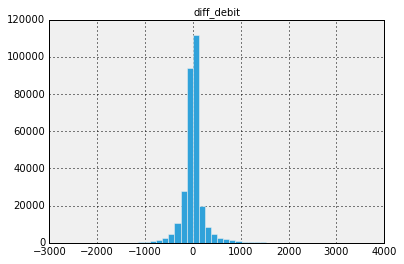

In [16]:
df3.hist('diff_debit',bins=50)

Populating the interactive namespace from numpy and matplotlib


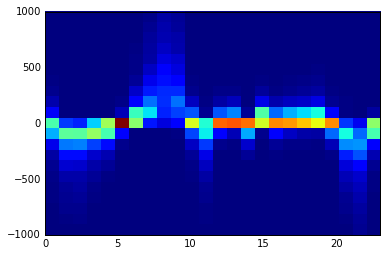

In [19]:
%pylab inline
import pylab as plt
df4 = df3.dropna()
df4 = df4[abs(df4.diff_debit)<1000]
plt.hist2d(df4.hour,df4.diff_debit,bins=(24,21));
# plt.gca().set_xlim(-.5,23.5)

In [70]:
dmax = df3.diff_debit.max()
dmin = df3.diff_debit.min()
dmax = max(abs(dmax),abs(dmin))
dmin = -max(abs(dmax),abs(dmin))

df3.diff_debit-=dmin
df3.diff_debit/=(dmax-dmin)
df3.diff_debit**=.5
df3.diff_debit-=.5
print df3.diff_debit.max()
print df3.diff_debit.min()

0.5
-0.0927908939857


In [71]:
from tqdm import tqdm_notebook as tqdm

In [72]:
# df2['diff_debit']=df2['AVG(debit)']*0

In [73]:
# %%output backend='bokeh'
# hv.Histogram(np.histogram(df2['diff_debit'],bins=20))

In [74]:
# trh = 15000
# df2.loc[df2['AVG(debit)']>trh,'AVG(debit)']=trh

## Interactive map

In [75]:
%%output backend='bokeh'
%%opts Overlay [width=int(750) height=int(750) xaxis=None yaxis=None] 
%%opts Points (size=10 cmap='jet') [tools=['hover'] color_index=2 width=int(750) height=int(750) xaxis=None yaxis=None]

pop = gv.Dataset(df3,kdims=['time'])
counters = pop.to(gv.Points, kdims=['lon', 'lat'],
                    vdims='AVG(debit)', crs=crs.PlateCarree())

# gv.WMTS(WMTSTileSource(url='https://maps.wikimedia.org/osm-intl/{Z}/{X}/{Y}@2x.png'),
#        crs=crs.epsg(2154)) * counters
counters


:HoloMap   [time]
   :Points   [lon,lat]   (AVG(debit))